<a href="https://colab.research.google.com/github/anustupdas/googleCollab_NOtebook_computer_vision/blob/main/Rank_Actors_Based_on_Duration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook contains experiments with different algorithms for combining the main actor detection with EI ratings.

This script assumes the face embeddings have already been requested & stored in the directory of the `response_dir` variable.

In [ ]:
import requests
import json
import os
import pathlib
import numpy as np
from collections import defaultdict

from md_dl_face_recognizer_common.dto import DetectedEmbeddingsResponseSchema
from md_dl_face_recognizer_common.utils import ensure_array, crop_image
from md_foundation.dto.annotation import AnnotationResponseSchema
from md_foundation.models.bounding_box import BoundingBox
from tqdm.notebook import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import abc

ModuleNotFoundError: ignored

In [ ]:
embedding_model = 'facenet'
landmarking_model = 'dlib_v2'
DATA_ROOT = pathlib.Path('/home/anustup/Documents/MD/files/ID-251/data/On nest pas des pigeons')
response_dir = DATA_ROOT.joinpath(f'responses_remote_{landmarking_model}_{embedding_model}')
ei_dir = DATA_ROOT.joinpath(f'episodic_images')
os.makedirs(str(response_dir), exist_ok=True)
os.makedirs(str(ei_dir), exist_ok=True)

embeddings_schema = DetectedEmbeddingsResponseSchema(strict=True)
ann_schema = AnnotationResponseSchema()

## Download Episodic Images responses & save to disk

In [ ]:
def get_response_episodicimages(img_path, host="http://md-dl-episodicimages-dev"):
    with open(img_path, 'rb') as f:
        data = f.read()
    rq = {'frame': data}
    return requests.post(f'{host}/detect', files=rq).json()

def download_ei_response(img_path):
    response_path = ei_dir.joinpath(f'{img_path.name}.json')
    if response_path.is_file():
        return
    for i in range(3):
        try:
            response = get_response_episodicimages(str(img_path))
        except Exception as e:
            print(e)
        else:
            break
    else:
        print("Failed after 3 retries")
        return
    
    with open(str(response_path), 'w') as f:
        json.dump(response, f)

In [ ]:
# Note: double check if the image extension is correct
# This takes a very very long time
for frame in tqdm(list(sorted(DATA_ROOT.glob("*.jpg")))):
    download_ei_response(frame)

  0%|          | 0/2809 [00:00<?, ?it/s]

HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7cd81250>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce3fad0>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce3c150>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7

HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7d672290>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7cd81f50>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce51290>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7

HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce22d50>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce19ad0>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7ce17cd0>: Failed to establish a new connection: [Errno -2] Name or service not known'))
HTTPConnectionPool(host='md-dl-episodicimages-dev', port=80): Max retries exceeded with url: /detect (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fcd7

## Load face embeddings

In [ ]:
def load_data(embeddings_dir, frames_dir):
    # Load data
    face_embeddings = []
    image_files = []
    face_crops = []
    embedding_files = list(sorted(embeddings_dir.glob("*.json")))

    for i, response in enumerate(tqdm(embedding_files)):
        with open(str(response), 'r') as f:
            response_json = json.load(f)
            embed_response = embeddings_schema.load(response_json).data
            img_id = response.with_suffix("").name
            img_path = frames_dir.joinpath(img_id)

            for detected_embedding in embed_response.embeddings:
                embedding = detected_embedding.embedding.vector
                if detected_embedding.annotation.confidence > 0.96 \
                        and detected_embedding.annotation.landmarks is not None:
                    face_embeddings.append(embedding)
                    image_files.append(img_path)
                    img_array = ensure_array(img_path)
                    face_bounding_box = detected_embedding.annotation.bounding_box
                    face_crop = crop_image(img_array, face_bounding_box)
                    face_crops.append(face_crop)

    face_embeddings = np.asarray(face_embeddings)
    return face_embeddings, image_files, face_crops

## Load EI responses from disk

In [ ]:
def load_ei_responses(responses_dir, frames_dir):
    responses = {}
    response_files = list(sorted(responses_dir.glob("*.json")))
    for i, response in enumerate(tqdm(response_files)):
        with open(str(response), 'r') as f:
            response_json = json.load(f)
            img_id = response.with_suffix("").name
            img_path = frames_dir.joinpath(img_id)
            responses[img_path] = response_json
    return responses

In [ ]:
def image_to_actors(input_files, actors):
    # Convert a list of [img_file], [actor] to a dict of {img_file: [actors]}
    # e.g. ["img1", "img1"], [0, 1] -> {"img1": [0, 1]}
    _image_to_actors = defaultdict(list)
    for f, actor in zip(input_files, actors):
        _image_to_actors[f].append(actor)
    return dict(_image_to_actors)


def preds_to_biggest_actors(annotation_responses):
    pred_labels = np.array([int(ann.class_name) for ann in annotation_responses.annotations])
    c_labels = pred_labels[pred_labels != -1]
    # For each embedding, find whether it corresponds to the nth biggest actor
    cluster_ids, counts = np.unique(c_labels, return_counts=True)
    _sort = np.argsort(counts)[::-1]
    biggest_clusters = cluster_ids[_sort].tolist()
    n_actors = len(biggest_clusters)
    biggest_actors = np.zeros(len(pred_labels), dtype=int) - 1  # default = -1
    for i, cluster_ids in enumerate(biggest_clusters):
        biggest_actors[np.where(pred_labels == cluster_ids)] = i
    return biggest_actors, n_actors

In [ ]:
def cluster_remote(embeddings,
                   cluster_metric='cosine',
                   min_cluster_size=5,
                   min_samples=None,
                   pca_preprocess=True,
                   pca_components=60,
                   filter_norm=True,
                   min_norm=6.5):
    _embeddings = embeddings.tolist()
    params = {
        "cluster_metric": cluster_metric,
        "min_cluster_size": min_cluster_size,
        "min_samples": min_samples,
        "pca_preprocess": pca_preprocess,
        "pca_components": pca_components,
        "filter_norm": filter_norm,
        "min_norm": min_norm
    }
    response = requests.post("http://dl-face-clustering-service-dev/api/1/cluster/hdbscan",
                             params=params,
                             json=_embeddings,
                             headers={'accept': 'application/json'})
    return response

In [ ]:
# Load face embeddings
face_embeddings, image_files, face_crops = load_data(response_dir, DATA_ROOT)

  0%|          | 0/945 [00:00<?, ?it/s]

In [ ]:
# Cluster embeddings
response = cluster_remote(face_embeddings)
annotation_responses = ann_schema.load(response.json()).data 
# Find biggest actors
biggest_actors, n_actors = preds_to_biggest_actors(annotation_responses)
# For each image get the actors that appear in it
images_actors = image_to_actors(image_files, biggest_actors)

In [ ]:
ei_responses = load_ei_responses(ei_dir, frames_dir=DATA_ROOT)

  0%|          | 0/945 [00:00<?, ?it/s]

In [ ]:
def parse_ei_response(ei_response_json) -> dict:
    score = ei_response_json['annotations'][0]['score']
    crop_bbox = ei_response_json['annotations'][0]['bounding_box']
    return {"score": score, "bounding_box": crop_bbox}

In [ ]:
ei_parsed = {}
for k, r in ei_responses.items():
    response_parsed = parse_ei_response(r)
    ei_parsed[str(k)] = response_parsed

In [ ]:
def merge_dicts(a, b):
    merged = dict(a)
    for k, v in b.items():
        if k in merged:
            merged[k].update(v)
        else:
            merged[k] = v
    return merged

In [ ]:
# Merge the EI ratings and cluster predictions in a single dictionary
joined_predictions = merge_dicts(ei_parsed, {str(k): {"actors": v} for k, v in images_actors.items()})

In [ ]:
joined_predictions

{'/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/001c45a9-154c-4e46-a20c-b967b27af00f.jpg': {'score': 4.256286032807772,
  'bounding_box': {'bottom_right': {'y': 860, 'x': 1914},
   'top_left': {'y': 0, 'x': 384}},
  'actors': [7, -1, -1]},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/004b7701-7fd5-494f-8571-309a478b7641.jpg': {'score': 12.88,
  'bounding_box': {'bottom_right': {'y': 860, 'x': 1807},
   'top_left': {'y': 0, 'x': 276}},
  'actors': [0]},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/005cdd3d-5313-4ee7-b1aa-87f8220dd622.jpg': {'score': 7.57,
  'bounding_box': {'bottom_right': {'y': 803, 'x': 1914},
   'top_left': {'y': 0, 'x': 481}}},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/006f9b7b-5f55-4ca3-8f3c-6c55b815a4ba.jpg': {'score': 0.0,
  'bounding_box': None,
  'actors': [0, 10]},
 '/home/timo/D

In [ ]:
len(joined_predictions)

945

In [ ]:
def plot_proposals(proposals: list):
    fig, axs = plt.subplots(ncols=5, figsize=(40, 6))
    for i, (_path, predictions) in enumerate(proposals):
        source_img = ensure_array(_path)
        if 'bounding_box' in predictions and predictions['bounding_box'] is not None:
            cropped = crop_image(source_img, BoundingBox.from_json_object(predictions['bounding_box']))
            axs[i].imshow(cropped)
        else:
            print(predictions)
            axs[i].imshow(source_img)
        axs[i].axis('off')
        axs[i].set_title(f"score = {predictions['score']:.3f}")
    plt.tight_layout()
    plt.show()

{'score': 0.0, 'bounding_box': None, 'actors': [0, 10]}


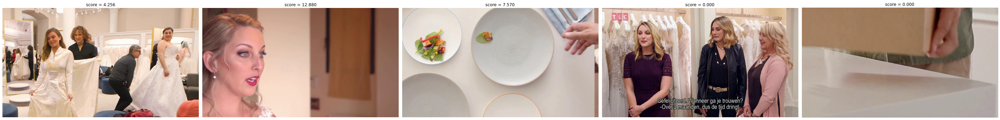

In [ ]:
plot_proposals((k, v) for k, v in list(joined_predictions.items())[:5])

In [ ]:
def find_actors(predictions:dict, actors: list):
    # Find all predictions containing all of the specified actors
    return {
        k: v for k, v in predictions.items() 
        if 'actors' in v and
        all([a in v['actors'] for a in actors])
    }

In [ ]:
find_actors(joined_predictions, [1])

{'/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/02fa1c17-7ae4-44ba-a301-d0dbefdd44d0.jpg': {'score': 0.0,
  'bounding_box': {'bottom_right': {'y': 675, 'x': 1891},
   'top_left': {'y': 0, 'x': 688}},
  'actors': [1]},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/08a64010-c157-4e62-b641-444f43003715.jpg': {'score': 14.13,
  'bounding_box': {'bottom_right': {'y': 860, 'x': 1914},
   'top_left': {'y': 0, 'x': 384}},
  'actors': [1]},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/08bffa59-977e-4b1f-b3be-0178b8e02ef7.jpg': {'score': 0.0,
  'bounding_box': None,
  'actors': [8, 1]},
 '/home/timo/Documents/MD/files/ID-251/data/553b188a-0fec-3a4f-8edc-bbedba00bdaf-truncated/0a355568-07c0-4f9e-a1c7-41a345335212.jpg': {'score': -2.2106426182513133,
  'bounding_box': {'bottom_right': {'y': 860, 'x': 1914},
   'top_left': {'y': 0, 'x': 384}},
  'actors': [1, 7]},
 '

## Ranking methods

In [ ]:
class Ranker(abc.ABC):
    @abc.abstractmethod
    def rank(self, predictions: dict) -> list:
        pass

Baseline: just rank based on episodicimages score.

In [ ]:
class EIRanker(Ranker):
    def rank(self, predictions) -> list:
        frame_ids, predictions = zip(*[(k, v) for k, v in predictions.items()])
        scores = np.asarray([pred['score'] for pred in predictions])
        best_idxs = np.argsort(scores)[::-1]
        return [(frame_ids[i], predictions[i]) for i in best_idxs[:5]]

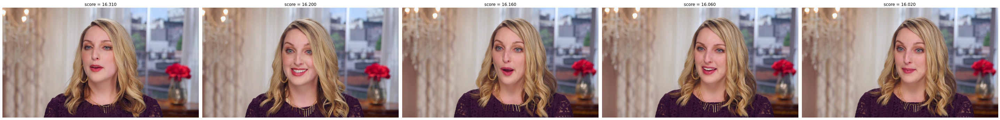

In [ ]:
ranker = EIRanker()
ranked = ranker.rank(joined_predictions)
plot_proposals(ranked)

Option 1: 

1st proposal is highest rated containing 1st actor, 2nd proposal is highest rated containing 2nd actor,etc.

In [ ]:
# Algorithm 1
class BasicActorRanker(Ranker):
    def rank(self, predictions:dict) -> list:
        best_rows = []
        picked_frames = set()
        for actor in range(5):
            matching_frames = find_actors(predictions, [actor])
            frames_list, scores = zip(*[(k, v['score']) for k, v in matching_frames.items()])
            best_idx = np.argsort(scores)[::-1]
            for i in best_idx:
                best_frame = frames_list[i]
                if best_frame not in picked_frames:
                    best_rows.append((best_frame, matching_frames[best_frame]))
                    picked_frames.add(best_frame)
                    break
        return best_rows

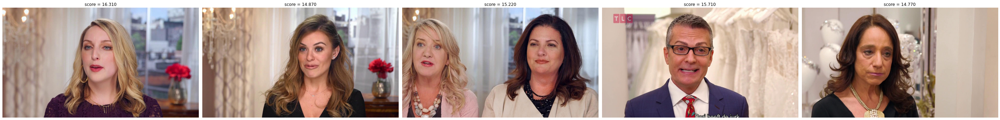

In [ ]:
ranker = BasicActorRanker()
ranked = ranker.rank(joined_predictions)
plot_proposals(ranked)

Options: 

1. check whether the _set_ of actors has already been chosen
2. check whether the individual actors have already been chosen

Idea: check the top rated frames, which actors belong to it. Then, pick the next best-rated frame that contains a different set of actors.

In [ ]:
# Algorithm 2
class ActorVarietyRanker(Ranker):
    def rank(self, predictions:dict) -> list:
        frame_ids, predictions = zip(*[(k, v) for k, v in predictions.items()])
        scores = np.asarray([pred['score'] for pred in predictions])
        actors = []
        for pred in predictions:
            if 'actors' in pred:
                actors.append([a for a in pred['actors'] if a != -1])
            else:
                actors.append([])
        
        actors_sets = set()
        picked_idxs = []
        # loop from highest scores to lower
        for i in np.argsort(scores)[::-1]:
            pred_actors = set(actors[i])
            # Skip frames without actor?
            # -> implications: shows where main actor detection is less important will fail
            if len(pred_actors) == 0:
                continue
            if pred_actors in actors_sets:
                continue
            else:
                picked_idxs.append(i)
                actors_sets.add(frozenset(pred_actors))
            if len(picked_idxs) == 5:
                break
        return [(frame_ids[i], predictions[i]) for i in picked_idxs]

problem: doesn't take into account the main actor-ness

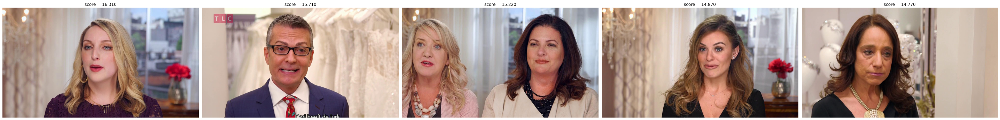

In [ ]:
ranker = ActorVarietyRanker()
ranked = ranker.rank(joined_predictions)
plot_proposals(ranked)

Idea: 

* assign a score to each frame based on the number of actors that appear in it.
    * 1 = all main actors (will never realistically happen)
    * 0 = no actors
* Normalize the EI scores and calculate a weighted average between this score and the normalized EI scores

In [ ]:
def actor_score_func(actors, n_actors):
    if len(actors) == 0:
        return 0
    return np.sum((n_actors - actors) / np.sum(np.arange(n_actors+1)))

# Some examples of this score func
print(actor_score_func(np.asarray([0, 1, 2, 3]), 4))
print(actor_score_func(np.asarray([0, 1, 2, 3]), 5))
print(actor_score_func(np.asarray([0, 1, 2, 3]), 7))
print(actor_score_func(np.asarray([1, 2, 3]), 7))
print(actor_score_func(np.asarray([0]), 7))
print(actor_score_func(np.asarray([1]), 7))

0.9999999999999999
0.9333333333333333
0.7857142857142858
0.5357142857142857
0.25
0.21428571428571427


In [ ]:
def get_n_actors(predictions: dict) -> int:
    actors = set()
    for k, v in predictions.items():
        if 'actors' in v:
            for actor in v['actors']:
                if actor != -1:
                    actors.add(actor)
    return len(actors)

def weighted_average(a, b, w_a, w_b):
    return np.average(np.stack([a, b]), axis=0, weights=[w_a, w_b])


# Algorithm 3
class ManyActorsRanker(Ranker):
    
        
    def rank(self, predictions: dict, w_actor=1, w_ei=1) -> list:
        n_actors = get_n_actors(predictions)
        frame_ids, predictions = zip(*[(k, v) for k, v in predictions.items()])
        
        actors = []
        for pred in predictions:
            if 'actors' in pred:
                actors.append(list(set([a for a in pred['actors'] if a != -1])))
            else:
                actors.append([])
        actors_scores = np.array([actor_score_func(np.array(a), n_actors) for a in actors])
        
        ei_scores = np.array([pred['score'] for pred in predictions])
        normalized_ei_scores = ei_scores / np.max(ei_scores)
        
        combined_scores = weighted_average(actors_scores, normalized_ei_scores, w_actor, w_ei)
        
        top_5 = np.argsort(combined_scores)[::-1][:5]
        return [(frame_ids[i], predictions[i]) for i in top_5]

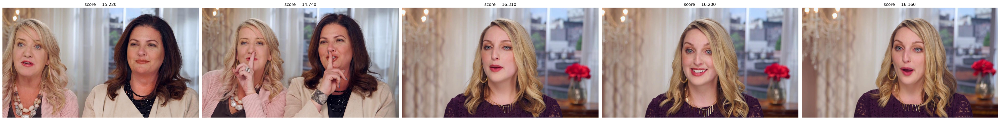

In [ ]:
ranker = ManyActorsRanker()
ranked = ranker.rank(joined_predictions, w_actor=1.5)
plot_proposals(ranked)

A downside of this method is that there is no filter based on the variety of people.

In [ ]:
# Algorithm 4
class ManyUniqueActorsRanker(Ranker):
    def rank(self, predictions: dict, w_actor=1, w_ei=1) -> list:
        n_actors = get_n_actors(predictions)
        frame_ids, predictions = zip(*[(k, v) for k, v in predictions.items()])
        
        actors = []
        for pred in predictions:
            if 'actors' in pred:
                actors.append(list(set([a for a in pred['actors'] if a != -1])))
            else:
                actors.append([])
        actors_scores = np.array([actor_score_func(np.array(a), n_actors) for a in actors])
        
        # Calculate combined actor + ei score
        ei_scores = np.array([pred['score'] for pred in predictions])
        normalized_ei_scores = ei_scores / np.max(ei_scores)
        combined_scores = weighted_average(actors_scores, normalized_ei_scores, w_actor, w_ei)
        
        # Pick frames with unique actor sets
        actors_sets = set()
        picked_idxs = []
        # loop from highest scores to lower
        for i in np.argsort(combined_scores)[::-1]:
            pred_actors = set(actors[i])
            # Skip frames without actor?
            # -> implications: shows where main actor detection is less important will fail
            if len(pred_actors) == 0:
                continue
            if pred_actors in actors_sets:
                continue
            else:
                picked_idxs.append(i)
                actors_sets.add(frozenset(pred_actors))
        return [(frame_ids[i], predictions[i]) for i in picked_idxs[:5]]

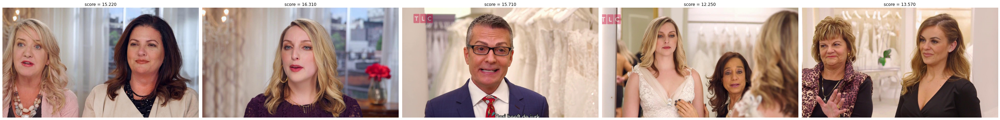

In [ ]:
ranker = ManyUniqueActorsRanker()
ranked = ranker.rank(joined_predictions, w_actor=1.5)
plot_proposals(ranked)

In [ ]:
# Algorithm 5
class ManyUniqueActorsRanker2(Ranker):
    def rank(self, predictions: dict, w_actor=1, w_ei=1) -> list:
        n_actors = get_n_actors(predictions)
        frame_ids, predictions = zip(*[(k, v) for k, v in predictions.items()])
        
        actors = []
        for pred in predictions:
            if 'actors' in pred:
                actors.append(list(set([a for a in pred['actors'] if a != -1])))
            else:
                actors.append([])
        actors_scores = np.array([actor_score_func(np.array(a), n_actors) for a in actors])
        
        # Calculate combined actor + ei score
        ei_scores = np.array([pred['score'] for pred in predictions])
        normalized_ei_scores = ei_scores / np.max(ei_scores)
        combined_scores = weighted_average(actors_scores, normalized_ei_scores, w_actor, w_ei)
        
        # Pick frames with unique actors (not sets, just the actor)
        found_actors = set()
        picked_idxs = []
        # loop from highest scores to lower
        for i in np.argsort(combined_scores)[::-1]:
            pred_actors = set(actors[i])
            # Skip frames without actor?
            # -> implications: shows where main actor detection is less important will fail
            if len(pred_actors) == 0:
                continue
            if any(a in found_actors for a in pred_actors):
                continue
            else:
                picked_idxs.append(i)
                found_actors = found_actors.union(pred_actors)
        for i in picked_idxs:
            print(actors[i])
        return [(frame_ids[i], predictions[i]) for i in picked_idxs[:5]]

[2, 5]
[0]
[3]
[8, 1]
[4]
[12]
[10]
[11]
[9]
[7]
[6]


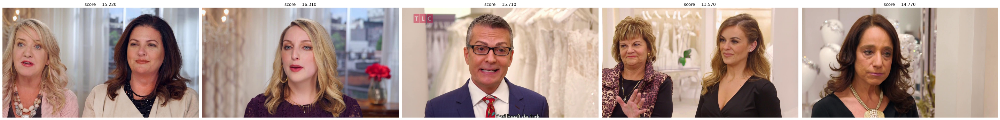

In [ ]:
ranker = ManyUniqueActorsRanker2()
ranked = ranker.rank(joined_predictions, w_actor=1.5)
plot_proposals(ranked)